In [1]:
include("speciale_tools.jl")
import JLD
import PyPlot
import Random
import Distributions
import LinearAlgebra

┌ Info: Precompiling Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
└ @ Base loading.jl:1273


ArgumentError: ArgumentError: Package Distributions not found in current path:
- Run `import Pkg; Pkg.add("Distributions")` to install the Distributions package.


In [2]:

function loss_rg_fit(VV,VH, seed_mask, rg_mask_change,target_mu,target_sigma, distance_list, d)

    rg_mask_int = ((VV .< target_mu[1]) .& (VH .< target_mu[2])) .| (distance_list .< d)
    rg_mask = rg_mask_change .& rg_mask_int
    flood_mask,steps = region_growing(seed_mask,rg_mask_int .& rg_mask_change);
    loss = loss_2d_gauss(vec(VV[flood_mask]),vec(VH[flood_mask]),target_mu,target_sigma;n_levels=5)
    return loss
end

function loss_2d_gauss(VV,VH,target_mu,target_sigma;n_levels=5, max_q = 1)
    freq = freq_2d_gauss(VV,VH,target_mu,target_sigma;n_levels=n_levels, max_q =max_q)
    ture_freq = max_q/(n_levels*4)
    loss = sum((freq .- ture_freq).^2)
    return loss
end


function freq_2d_gauss(VV,VH,target_mu,target_sigma;n_levels=5,max_q = 1)
    
    N = length(VV)
    distri = Distributions.Chisq(2)
    chi_limits = Distributions.quantile.(distri, collect(range(0,length=n_levels+1,stop=max_q))[2:end])
    
    line1_mask, line2_mask = get_pca_mask(VV,VH,target_mu,target_sigma)
    malhob = get_malhob(VV,VH,target_mu,target_sigma)
    
    frequency = zeros(Float64,(4,n_levels))
    
    frequency[1,:] .= count_chi_limit(malhob[   line1_mask .&   line2_mask],chi_limits)./N
    frequency[2,:] .= count_chi_limit(malhob[ .!line1_mask .&   line2_mask],chi_limits)./N
    frequency[3,:] .= count_chi_limit(malhob[ .!line1_mask .& .!line2_mask],chi_limits)./N
    frequency[4,:] .= count_chi_limit(malhob[   line1_mask .& .!line2_mask],chi_limits)./N
    
    return frequency
end

function get_pca_mask(VV,VH,target_mu,target_sigma)
    pc = LinearAlgebra.eigvecs(target_sigma)
    
    a1 = pc[1,1] /pc[2,1]
    b1 = target_mu[2] - target_mu[1] * a1
    line1_mask = VH .>  (VV.* a1 .+ b1) ;
    
    a2 = pc[1,2] /pc[2,2]
    b2 = target_mu[2] - target_mu[1] * a2
    line2_mask = VH .>  (VV.* a2 .+ b2) ;
    
    return line1_mask, line2_mask
end


function get_malhob(VV,VH,mu,sigma)
    malhob = cat(vec(VV) .- mu[1],vec(VH).- mu[2],dims=2)
    
    inv_sigma = sigma^-1;
    malhob = [transpose(malhob[i,:])*inv_sigma*(malhob[i,:]) for i in 1:length(VV)];
    malhob = reshape(malhob,size(VV));
    return malhob
end


function count_chi_limit(malhob,chi_limits)
    counts = zeros(Int64, length(chi_limits))
    
    counts[1] = sum(malhob .< chi_limits[1])
    
    for i in 2:(length(chi_limits))
        counts[i] = sum(chi_limits[i-1] .< malhob .< chi_limits[i])
    end
    
    return counts
end



count_chi_limit (generic function with 1 method)

In [342]:
data_folder = "/home/data/simon/processed/test_areas/ribe_new/flood"
#data_folder = "/Users/simon/Documents/DTU fag/Speciale/ribe_new/flood"
#figure_folder = "/home/data/simon/result/HSBA_loss2/HSBA_houston"

VV = [JLD.load(joinpath(data_folder,"VV_co.jld"),"data"),
    JLD.load(joinpath(data_folder,"VV_pre_median.jld"),"data")]
VV = [band[:,end:-1:1] for band in VV]
VV_db = [10 .*log10.(band) for band in VV]

VH = [JLD.load(joinpath(data_folder,"VH_co.jld"),"data"), 
    JLD.load(joinpath(data_folder,"VH_pre_median.jld"),"data")];

VH = [band[:,end:-1:1] for band in VH];
VH_db = [10 .*log10.(band) for band in VH];

In [343]:
data_folder = "/home/data/simon/processed/test_areas/ribe_new"
#data_folder = "/Users/simon/Documents/DTU fag/Speciale/ribe_new"
VV_files,VH_files,coherence_VV_files,coherence_VH_files = _sort_prossed_files(data_folder);
coh = [abs.(band) for band in _load_jld(coherence_VV_files,data_folder)]
coh = [coh[1][:,end:-1:1],(sum(coh[2:end])./length(coh[2:end]))[:,end:-1:1]];

In [344]:
delta_VV = VV_db[1] .- VV_db[2]
delta_VH = VH_db[1] .- VH_db[2]
delta_coh = coh[1] .- coh[2];

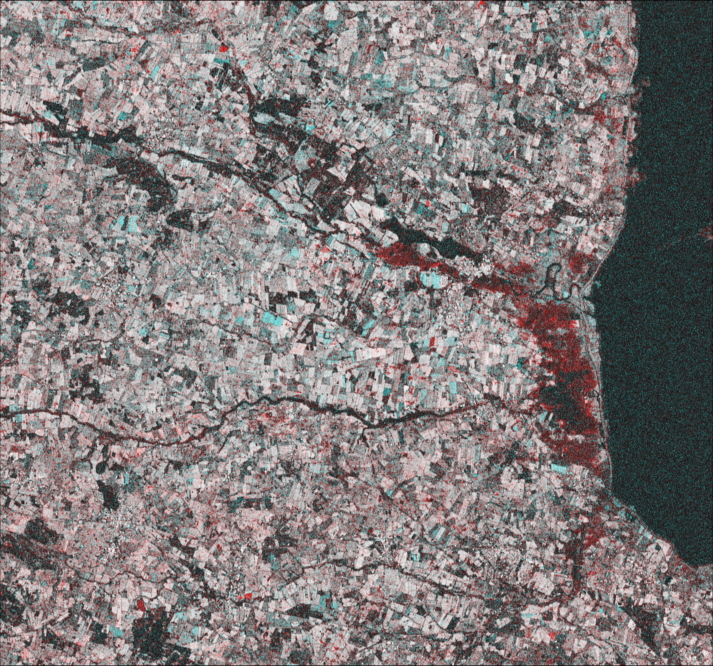

In [345]:
 img_coh = Colors.RGB.(coh[2],coh[1],coh[1])

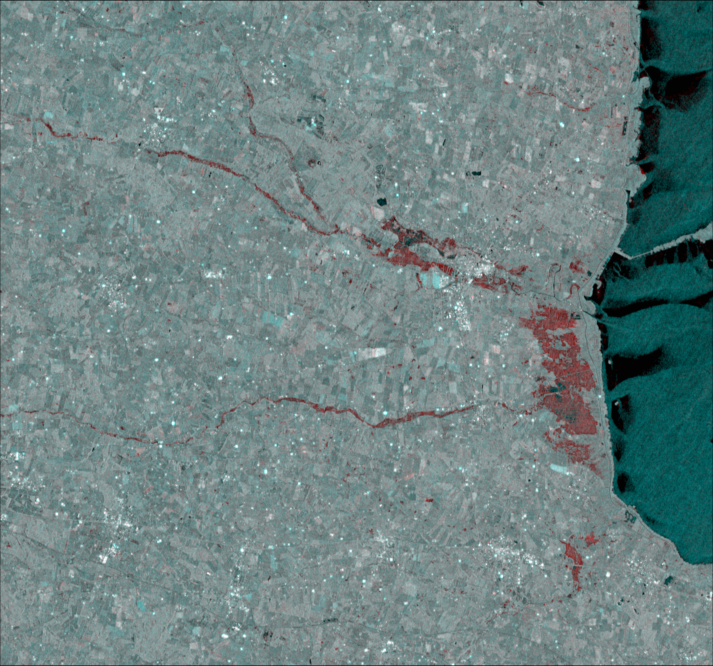

In [346]:
imgVV = pretty_img(VV,min_vv,max_vv)

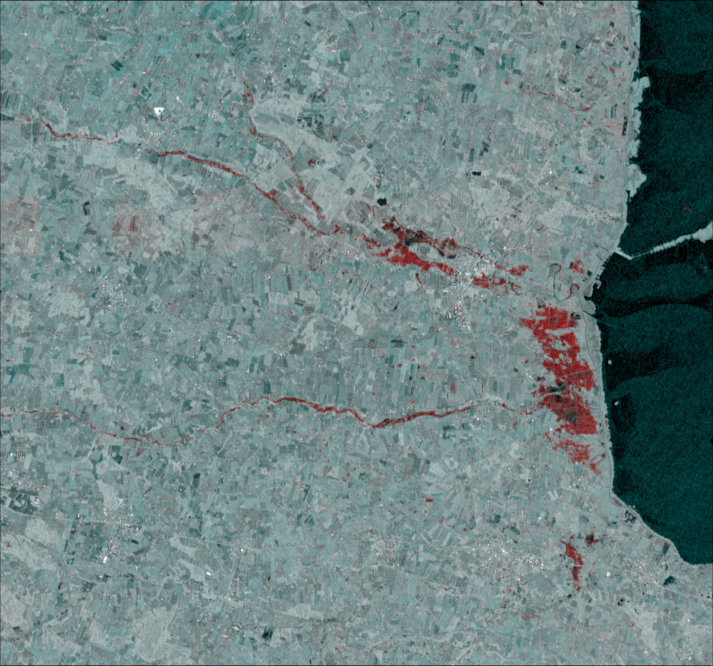

In [347]:
imgVH = pretty_img(VH,min_vh,max_vh)

## Red points 

In [323]:
## red_pixel 

In [297]:
sure_red = (delta_VV.<-2)  .& (delta_VH.<-2) .& (VV_db[1] .< -3) .& (VH_db[1] .< -7);

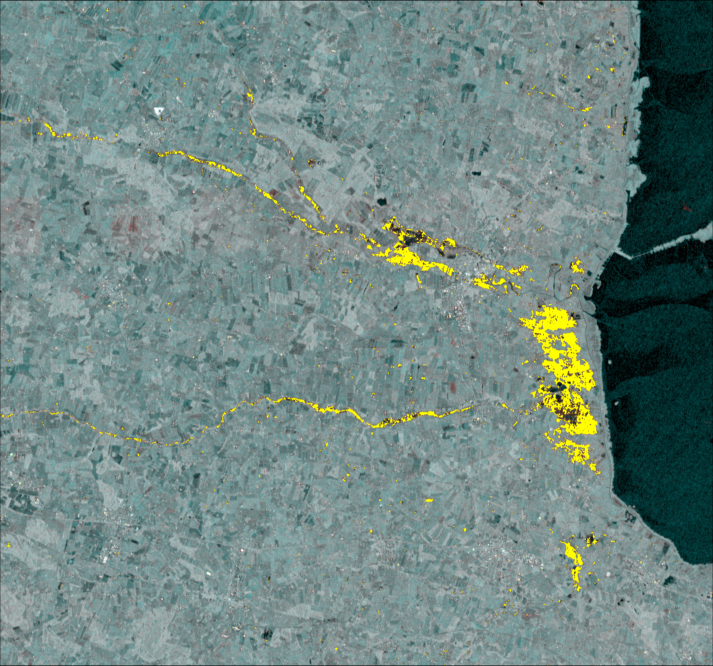

In [298]:
add_mask(imgVH,sure_red ,(1,1,0))

suf_temp = Random.randperm(Random.MersenneTwister(124), sum(sure_red))

sure_red_VV = VV_db[1][sure_red][suf_temp]
sure_red_VH = VH_db[1][sure_red][suf_temp]
sure_red_dVV = delta_VV[sure_red][suf_temp]
sure_red_dVH = delta_VH[sure_red][suf_temp];

In [299]:
sure_red_VV = vec(VV_db[1][sure_red])
sure_red_VH = vec(VH_db[1][sure_red])
sure_red_dVV = vec(delta_VV[sure_red])
sure_red_dVH = vec(delta_VH[sure_red]);

## Multi gauss test 

In [13]:
mu_flood = [Statistics.mean(sure_red_VV),Statistics.mean(sure_red_VH)]


2-element Array{Float64,1}:
 -14.878653297219117
 -20.97631681396009 

In [14]:
sigma_flood = Statistics.cov(cat(sure_red_VV,sure_red_VH, dims=2), dims=1)

2×2 Array{Float64,2}:
 5.89851  4.85242
 4.85242  5.99767

p0 =[mu_flood[1],mu_flood[2],sigma_flood[1,1], sigma_flood[2,2],sigma_flood[1,2]]
    res = Optim.optimize(
        p -> loss_2d_gauss(sure_red_VV,sure_red_VH, [p[1],p[2]], [p[3] p[5]; p[5] p[4]] ,n_levels=10,max_q=0.6), 
        p0; autodiff = :forward);

 p_res =  res.minimizer
mu_min = [ p_res[1], p_res[2]]
sigma_min = [p_res[3] p_res[5];p_res[5] p_res[4]] 

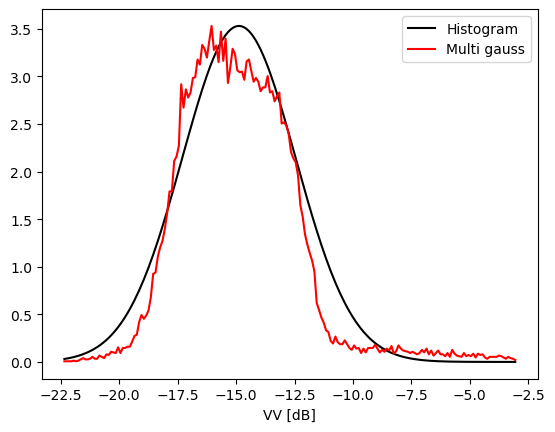

PyObject <matplotlib.legend.Legend object at 0x7f309c6f8400>

In [15]:
p_fit,y_VV,w_VV,edges, w_sum = fit_bimodal_gauss(sure_red_VV ,round(Int64,length(sure_red_VV)/100))
w_VV = w_VV./sum(w_VV)*length(y_VV)
#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()
PyPlot.plot(y_VV,gauss_model(y_VV,[maximum(w_VV),mu_flood[1],sqrt(sigma_flood[1,1])]),color="k")
#PyPlot.plot(y_VV,gauss_model(y_VV,[maximum(w_VV),mu_min[1],sqrt(sigma_min[1,1])]),color="g")
PyPlot.plot(y_VV,w_VV,color="r")
PyPlot.xlabel("VV [dB]")
PyPlot.legend(["Histogram","Multi gauss"])

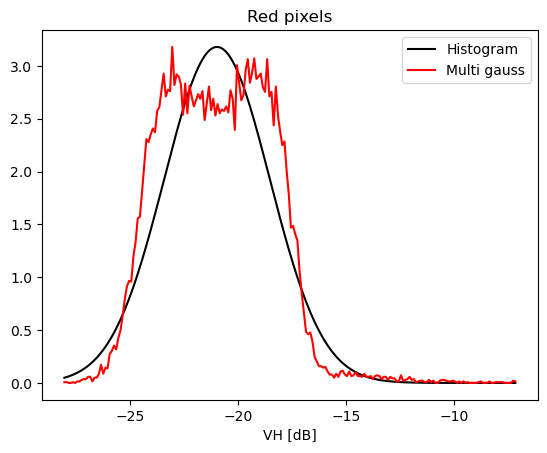

PyObject <matplotlib.legend.Legend object at 0x7f309c719d60>

In [16]:
p_fit,y_VH,w_VH,edges, w_sum = fit_bimodal_gauss(sure_red_VH ,round(Int64,length(sure_red_VH)/100))
w_VH = w_VH./sum(w_VH)*length(y_VH)
PyPlot.figure()
PyPlot.plot(y_VH,gauss_model(y_VH,[maximum(w_VH),mu_flood[2],sqrt(sigma_flood[2,2])]),color="k")
#PyPlot.plot(y_VH,gauss_model(y_VH,[maximum(w_VH),mu_min[2],sqrt(sigma_min[2,2])]),color="g")

PyPlot.plot(y_VH,w_VH,color="r")
PyPlot.xlabel("VH [dB]")
PyPlot.title("Red pixels")
PyPlot.legend(["Histogram","Multi gauss"])

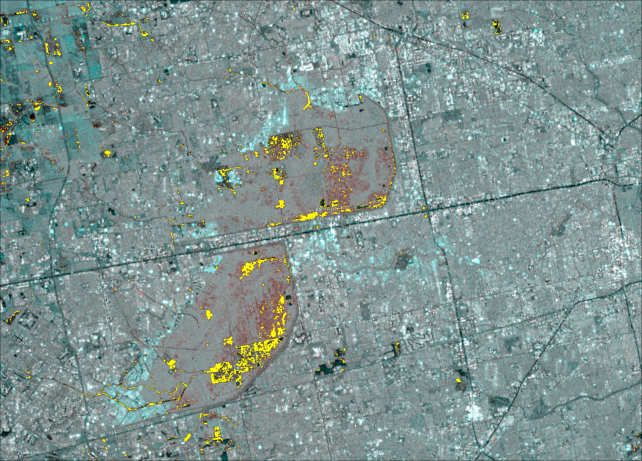

In [20]:
seed_mask = (delta_VV.<-2) .& (VV_db[1] .< mu_flood[1]) .& (delta_VH.<-2) .& (VH_db[1] .< mu_flood[2]);
add_mask(imgVV,seed_mask ,(1,1,0))

In [21]:
rg_mask_change = ((delta_VV.<-2) .& (delta_VH.<0)) .| 
                ((delta_VV.<0) .& (delta_VH.<-2)) .| ( ( (delta_VV .+2).^2 .+ (delta_VH .+2).^2) .< 4 ); 

In [22]:
test_d = collect(1:0.2:12);

In [30]:
malhob = cat(vec(VV_db[1]) .- mu_flood[1],vec(VH_db[1]).- mu_flood[2],dims=2)
inv_sigma = sigma_flood^-1;
malhob = [transpose(malhob[i,:])*inv_sigma*(malhob[i,:]) for i in 1:length(VV_db[1])];
malhob = reshape(malhob,size(VV_db[1]));
loss_mal = [loss_rg_fit(VV_db[1],VH_db[1], seed_mask, rg_mask_change,mu_flood,sigma_flood,malhob, d) for d in test_d ];

In [31]:
dist_cir = (VV_db[1] .-mu_flood[1]).^2 .+ (VH_db[1] .-mu_flood[2]).^2
loss_mal2 = [loss_rg_fit(VV_db[1],VH_db[1], seed_mask, rg_mask_change,mu_flood,sigma_flood,dist_cir, d.^2) for d in test_d ];

In [32]:
dist_abs = abs.(VV_db[1] .-mu_flood[1]) .+ abs.(VH_db[1] .-mu_flood[2])
loss_mal3 = [loss_rg_fit(VV_db[1],VH_db[1], seed_mask, rg_mask_change,mu_flood,sigma_flood,dist_abs, d) for d in test_d ];

## Vejle

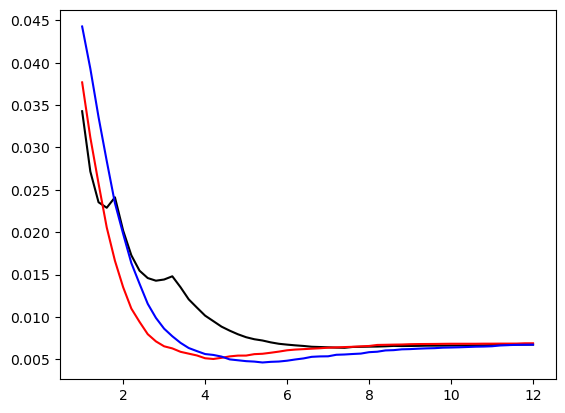

1-element Array{PyCall.PyObject,1}:
 PyObject <matplotlib.lines.Line2D object at 0x164373978>

In [586]:

PyPlot.figure()
PyPlot.plot(test_d,loss_mal,color="k")
PyPlot.plot(test_d,loss_mal2,color="r")
PyPlot.plot(test_d,loss_mal3,color="b")

In [587]:
loss_rg_fit(VV_db[1],VH_db[1], seed_mask, rg_mask_change,mu_flood,sigma_flood,malhob, 1)

0.03427538426001074

In [588]:
d_min = test_d[argmin(loss_mal)]
d_min, minimum(loss_mal), 
loss_rg_fit(VV_db[1],VH_db[1], seed_mask, rg_mask_change,mu_flood,sigma_flood,malhob, 1000000)

(7.4, 0.0063556819222243864, 0.0068909677947578815)

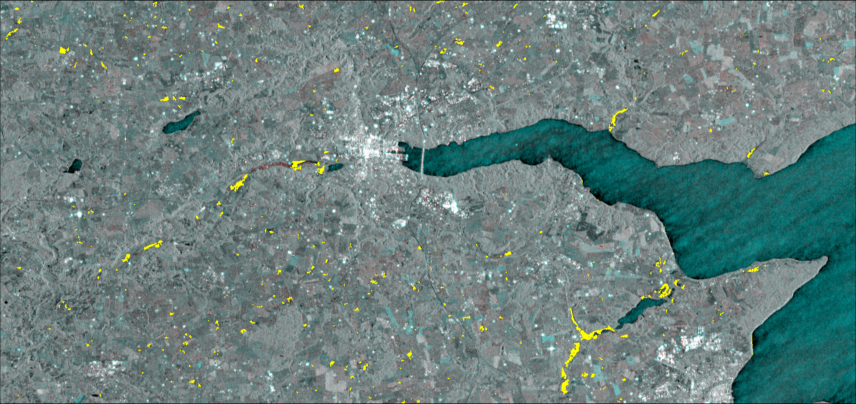

In [589]:
rg_mask_int = ((VV_db[1] .< mu_flood[1]) .& (VH_db[1] .< mu_flood[2])) .| (malhob .< d_min)
flood_test,steps = region_growing(seed_mask,rg_mask_int .& rg_mask_change);
add_mask(imgVV,flood_test,(1,1,0))

In [590]:
d_min = test_d[argmin(loss_mal2)]
d_min, minimum(loss_mal2),  
loss_rg_fit(VV_db[1],VH_db[1], seed_mask, rg_mask_change,mu_flood,sigma_flood,dist_cir, 1000000)

(4.2, 0.00503499399186787, 0.0068909677947578815)

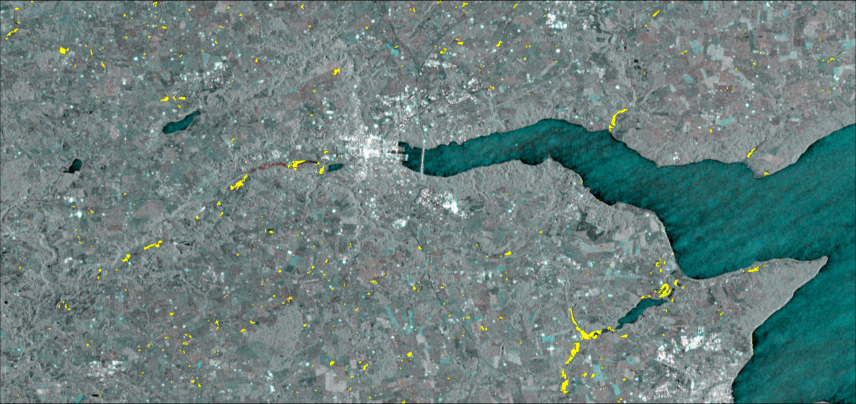

In [591]:
rg_mask_int = ((VV_db[1] .< mu_flood[1]) .& (VH_db[1] .< mu_flood[2])) .| (dist_cir .< d_min^2)
flood_test,steps = region_growing(seed_mask,rg_mask_int .& rg_mask_change);
add_mask(imgVV,flood_test,(1,1,0))

In [592]:
d_min = test_d[argmin(loss_mal3)]
d_min, minimum(loss_mal3),   
loss_rg_fit(VV_db[1],VH_db[1], seed_mask, rg_mask_change,mu_flood,sigma_flood,dist_abs, 1000000)

(5.4, 0.004623405671178907, 0.0068909677947578815)

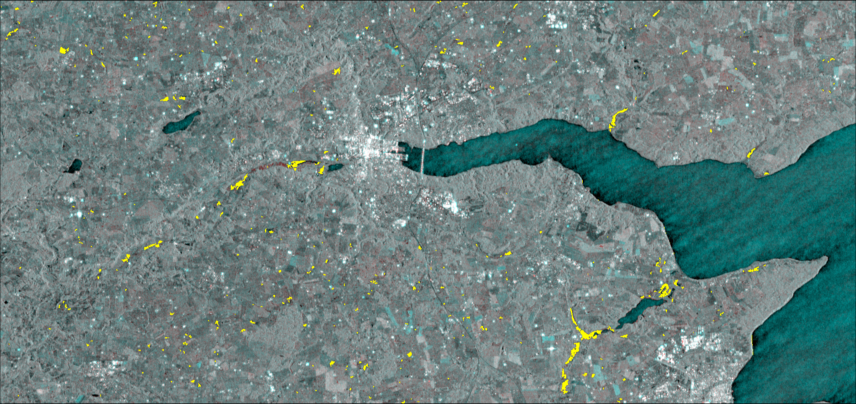

In [593]:
rg_mask_int = ((VV_db[1] .< mu_flood[1]) .& (VH_db[1] .< mu_flood[2])) .| (dist_abs .< d_min)
flood_test,steps = region_growing(seed_mask,rg_mask_int .& rg_mask_change);
add_mask(imgVV,flood_test,(1,1,0))

In [594]:
selected_VV = vec(VV_db[1][flood_test]);
selected_VH = vec(VH_db[1][flood_test]) ;

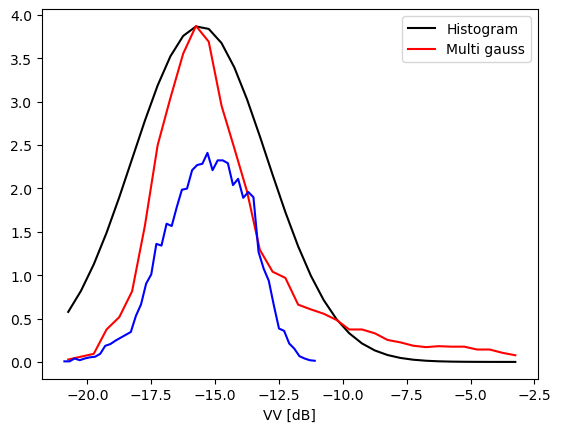

PyObject <matplotlib.legend.Legend object at 0x1560a79e8>

In [595]:
p_fit2,y_VV2,w_VV2,edges2, w_sum2 = fit_bimodal_gauss(selected_VV ,round(Int64,length(sure_red_VV)/100))
w_VV2 = w_VV2./sum(w_VV2)*length(y_VV2)
#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()
PyPlot.plot(y_VV,gauss_model(y_VV,[maximum(w_VV),mu_flood[1],sqrt(sigma_flood[1,1])]),color="k")

PyPlot.plot(y_VV,w_VV,color="r")
PyPlot.plot(y_VV2,w_VV2,color="b")
PyPlot.xlabel("VV [dB]")
PyPlot.legend(["Histogram","Multi gauss"])

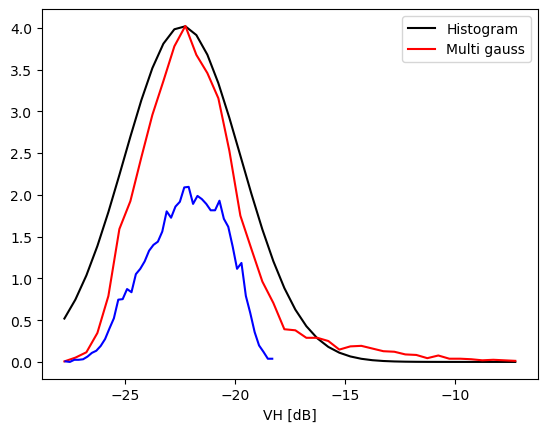

PyObject <matplotlib.legend.Legend object at 0x16076fb70>

In [596]:
p_fit2,y_VH2,w_VH2,edges2, w_sum2 = fit_bimodal_gauss(selected_VH ,round(Int64,length(sure_red_VV)/100))
w_VH2 = w_VH2./sum(w_VH2)*length(y_VH2)
#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()
PyPlot.plot(y_VH,gauss_model(y_VH,[maximum(w_VH),mu_flood[2],sqrt(sigma_flood[2,2])]),color="k")

PyPlot.plot(y_VH,w_VH,color="r")
PyPlot.plot(y_VH2,w_VH2,color="b")
PyPlot.xlabel("VH [dB]")
PyPlot.legend(["Histogram","Multi gauss"])

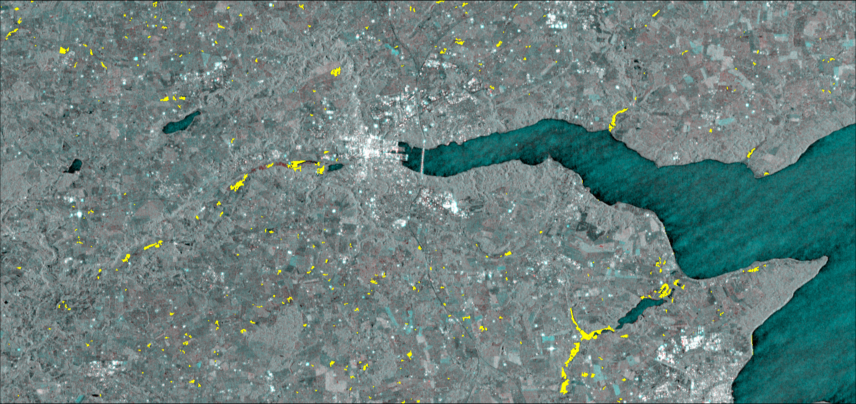

In [597]:
rg_mask_int = ((VV_db[1] .< mu_flood[1]) .& (VH_db[1] .< mu_flood[2])) .| (dist_abs .<15)
flood_test,steps = region_growing(seed_mask,rg_mask_int .& rg_mask_change);
add_mask(imgVV,flood_test,(1,1,0))

# RIBE



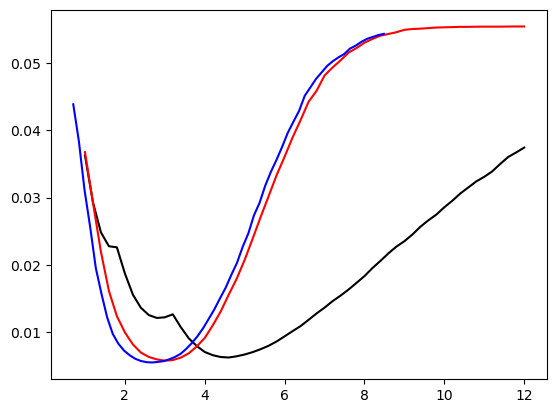

1-element Array{PyCall.PyObject,1}:
 PyObject <matplotlib.lines.Line2D object at 0x15d0cac50>

In [657]:

PyPlot.figure()
PyPlot.plot(test_d,loss_mal,color="k")
PyPlot.plot(test_d,loss_mal2,color="r")
PyPlot.plot(test_d./sqrt(2),loss_mal3,color="b")

In [658]:
d_min = test_d[argmin(loss_mal)]
d_min, minimum(loss_mal), 
loss_rg_fit(VV_db[1],VH_db[1], seed_mask, rg_mask_change,mu_flood,sigma_flood,malhob, 1000000)

(4.6, 0.006271342314620448, 0.05538235017328227)

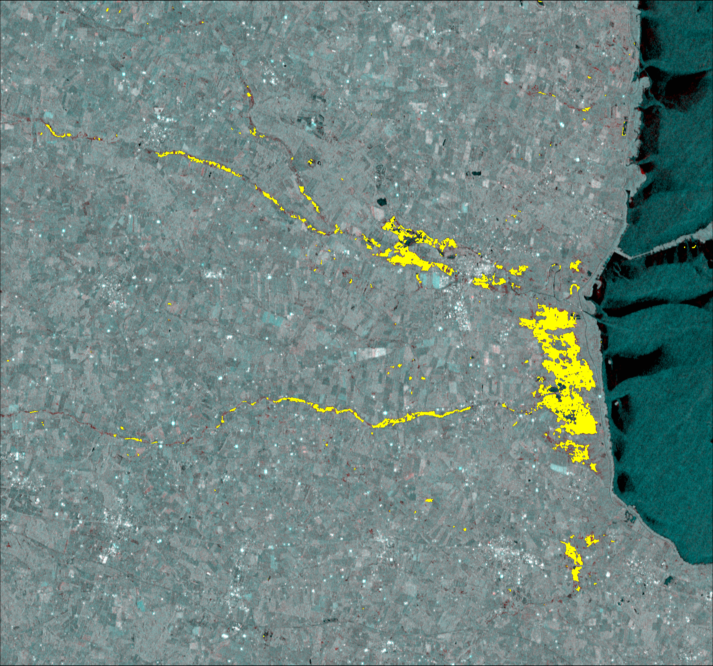

In [659]:
rg_mask_int = ((VV_db[1] .< mu_flood[1]) .& (VH_db[1] .< mu_flood[2])) .| (malhob .< d_min)
flood_test,steps = region_growing(seed_mask,rg_mask_int .& rg_mask_change);
add_mask(imgVV,flood_test,(1,1,0))

In [660]:
d_min = test_d[argmin(loss_mal2)]
d_min, minimum(loss_mal2),  
loss_rg_fit(VV_db[1],VH_db[1], seed_mask, rg_mask_change,mu_flood,sigma_flood,dist_cir, 1000000)

(3.0, 0.005800124855662194, 0.05538235017328227)

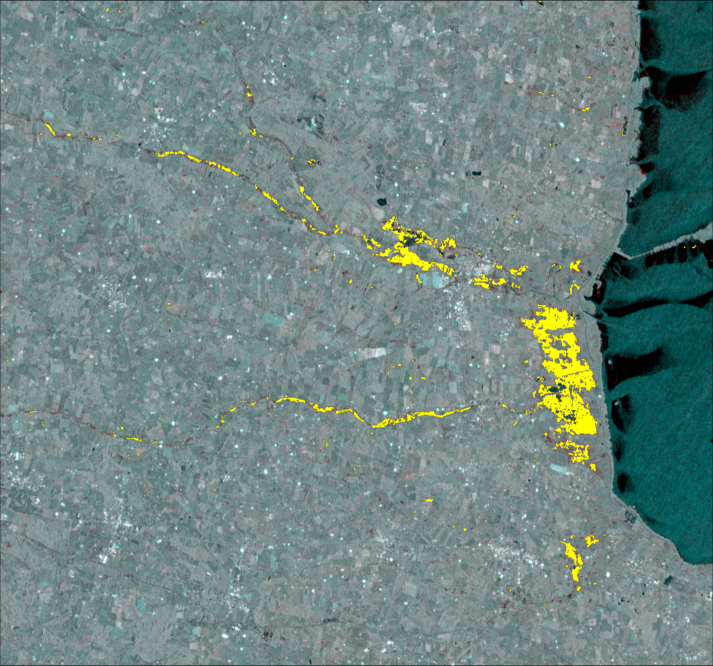

In [661]:
rg_mask_int = ((VV_db[1] .< mu_flood[1]) .& (VH_db[1] .< mu_flood[2])) .| (dist_cir .< d_min^2)
flood_test,steps = region_growing(seed_mask,rg_mask_int .& rg_mask_change);
add_mask(imgVV,flood_test,(1,1,0))

In [662]:
d_min = test_d[argmin(loss_mal3)]
d_min, minimum(loss_mal3),   
loss_rg_fit(VV_db[1],VH_db[1], seed_mask, rg_mask_change,mu_flood,sigma_flood,dist_abs, 1000000)

(3.8, 0.005532740933964443, 0.05538235017328227)

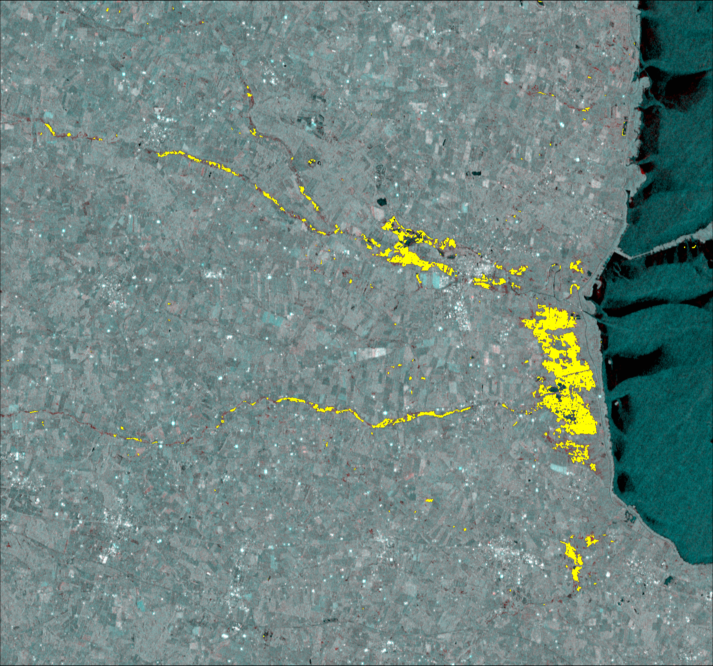

In [663]:
rg_mask_int = ((VV_db[1] .< mu_flood[1]) .& (VH_db[1] .< mu_flood[2])) .| (dist_abs .< d_min)
flood_test,steps = region_growing(seed_mask,rg_mask_int .& rg_mask_change);
add_mask(imgVV,flood_test,(1,1,0))

In [664]:
selected_VV = vec(VV_db[1][flood_test]);
selected_VH = vec(VH_db[1][flood_test]) ;

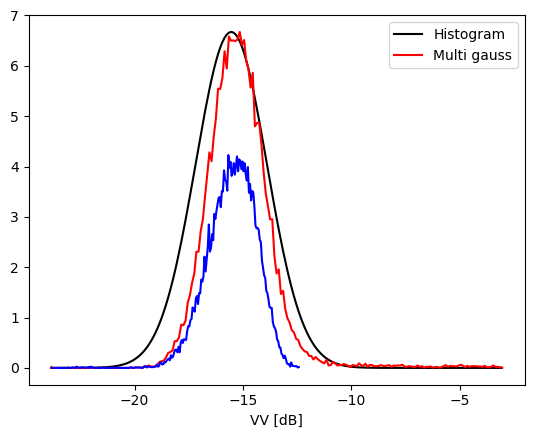

PyObject <matplotlib.legend.Legend object at 0x15d0f7780>

In [665]:
p_fit2,y_VV2,w_VV2,edges2, w_sum2 = fit_bimodal_gauss(selected_VV ,round(Int64,length(sure_red_VV)/100))
w_VV2 = w_VV2./sum(w_VV2)*length(y_VV2)
#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()
PyPlot.plot(y_VV,gauss_model(y_VV,[maximum(w_VV),mu_flood[1],sqrt(sigma_flood[1,1])]),color="k")

PyPlot.plot(y_VV,w_VV,color="r")
PyPlot.plot(y_VV2,w_VV2,color="b")
PyPlot.xlabel("VV [dB]")
PyPlot.legend(["Histogram","Multi gauss"])

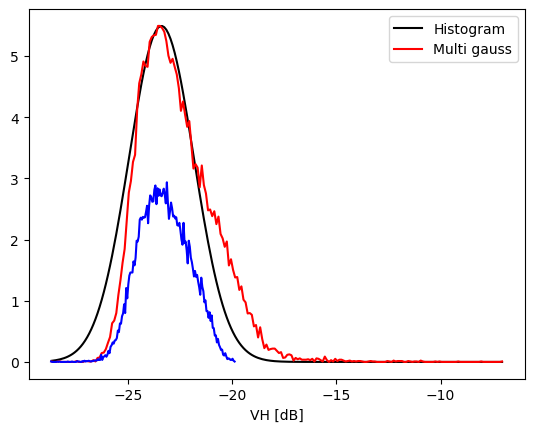

PyObject <matplotlib.legend.Legend object at 0x15d163cf8>

In [666]:
p_fit2,y_VH2,w_VH2,edges2, w_sum2 = fit_bimodal_gauss(selected_VH ,round(Int64,length(sure_red_VV)/100))
w_VH2 = w_VH2./sum(w_VH2)*length(y_VH2)
#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()
PyPlot.plot(y_VH,gauss_model(y_VH,[maximum(w_VH),mu_flood[2],sqrt(sigma_flood[2,2])]),color="k")

PyPlot.plot(y_VH,w_VH,color="r")
PyPlot.plot(y_VH2,w_VH2,color="b")
PyPlot.xlabel("VH [dB]")
PyPlot.legend(["Histogram","Multi gauss"])

# Houston

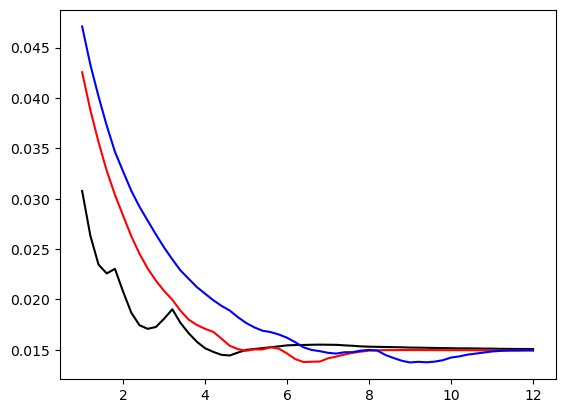

1-element Array{PyCall.PyObject,1}:
 PyObject <matplotlib.lines.Line2D object at 0x7f30697bf4c0>

In [35]:

PyPlot.figure()
PyPlot.plot(test_d,loss_mal,color="k")
PyPlot.plot(test_d,loss_mal2,color="r")
PyPlot.plot(test_d,loss_mal3,color="b")

In [39]:
d_min = test_d[argmin(loss_mal)]
d_min, minimum(loss_mal),   
loss_rg_fit(VV_db[1],VH_db[1], seed_mask, rg_mask_change,mu_flood,sigma_flood,malhob, 1000000)

(4.6, 0.014439325895532994, 0.014912701098458016)

In [41]:
d_min = test_d[argmin(loss_mal2)]
d_min, minimum(loss_mal2),  
loss_rg_fit(VV_db[1],VH_db[1], seed_mask, rg_mask_change,mu_flood,sigma_flood,dist_cir, 1000000)

(6.4, 0.013788622064597963, 0.014912701098458016)

In [43]:
d_min = test_d[argmin(loss_mal3)]
d_min, minimum(loss_mal3),  
loss_rg_fit(VV_db[1],VH_db[1], seed_mask, rg_mask_change,mu_flood,sigma_flood,dist_abs, 1000000)

(9.0, 0.013744541272784908, 0.014912701098458016)

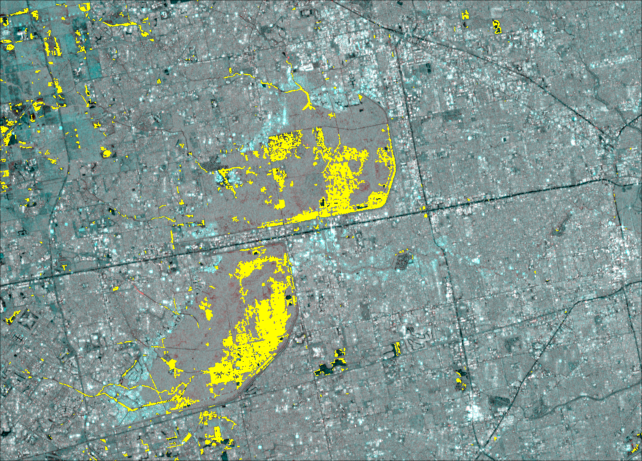

In [44]:
rg_mask_int = ((VV_db[1] .< mu_flood[1]) .& (VH_db[1] .< mu_flood[2])) .| (dist_abs .< d_min)
flood_test,steps = region_growing(seed_mask,rg_mask_int .& rg_mask_change);
add_mask(imgVV,flood_test,(1,1,0))

In [45]:
mu_flood

2-element Array{Float64,1}:
 -14.878653297219117
 -20.97631681396009 

In [51]:
mu_flood.+d_min ./2

2-element Array{Float64,1}:
 -10.378653297219117
 -16.47631681396009 

In [52]:
mu_flood +[d_min,0]

2-element Array{Float64,1}:
  -5.878653297219117
 -20.97631681396009 

In [53]:
 mu_flood +[0,d_min]

2-element Array{Float64,1}:
 -14.878653297219117
 -11.97631681396009 

# Cyan Pixels

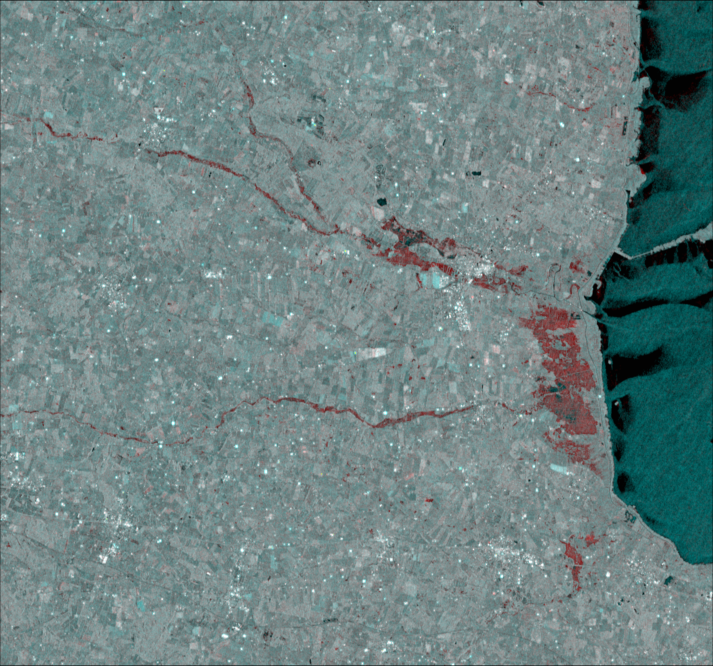

In [354]:
sure_cyan = (delta_VV.>6) .& (coh[2].> 0.5)  .& (coh[1].< 0.3) .& (VV_db[2].>-10) .& (delta_VH.> 0) 
add_mask(imgVV,sure_cyan,(1,1,0))

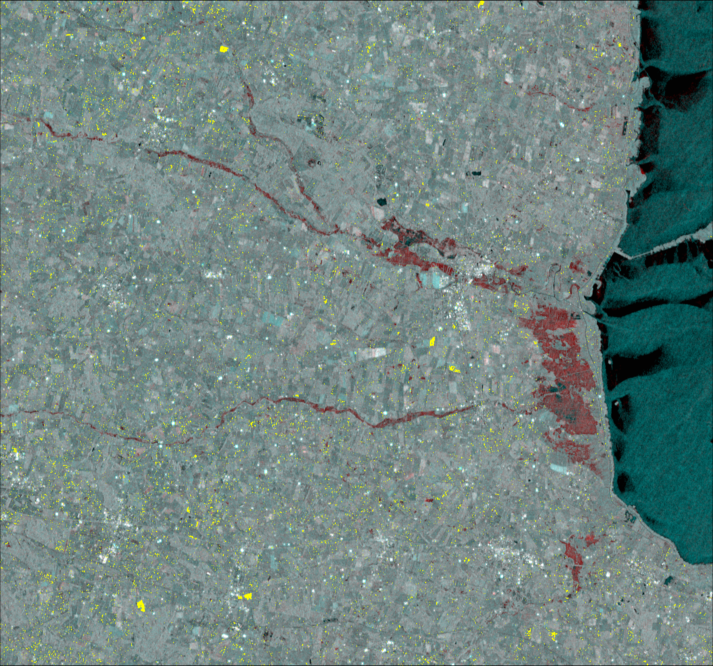

In [355]:
rg_mask = (delta_VV.>2) .& (coh[2].> 0.5) .& ((delta_coh .< -0.2)) .& (delta_VH.> 0) 
add_mask(imgVV,rg_mask,(1,1,0))

In [358]:
2+2

4

In [356]:
urban_test,steps = region_growing(sure_cyan,rg_mask );

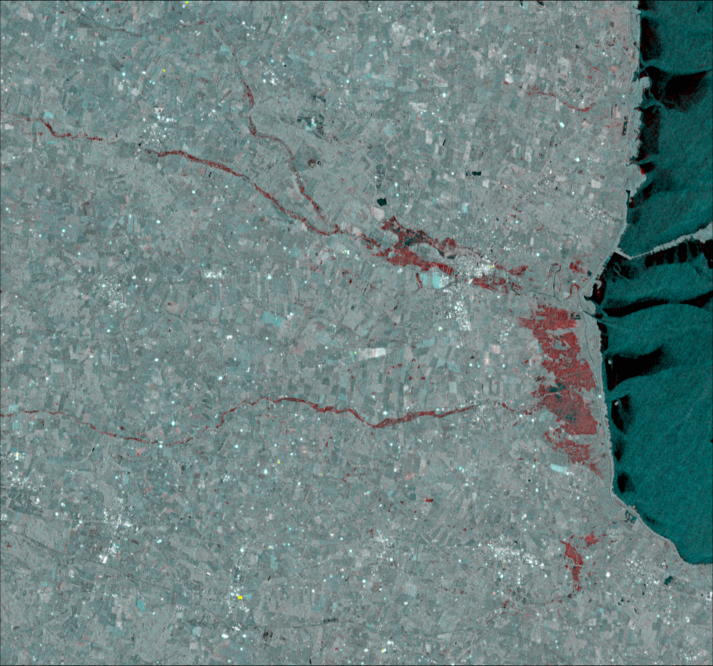

In [357]:
add_mask(imgVV,urban_test ,(1,1,0))

In [316]:
sum(urban_test)

157

In [ ]:
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(vec(delta_coh[sure_cyan]) ,round(Int64,length(delta_coh[sure_cyan])/100))

#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()
#PyPlot.plot(y,gauss_model(y,[maximum(w),mu_flood[1],sqrt(sigma_flood[1,1])]),color="k")

PyPlot.plot(y,w,color="r")
PyPlot.xlabel("VV [dB]")
PyPlot.legend(["Histogram","Multi gauss"])

In [58]:
suf_temp = Random.randperm(Random.MersenneTwister(124), sum(sure_cyan))

sure_cyan_VV = VV_db[1][sure_cyan][suf_temp]
sure_cyan_VH = VH_db[1][sure_cyan][suf_temp]
sure_cyan_dVV = delta_VV[sure_cyan][suf_temp]
sure_cyan_dVH = delta_VH[sure_cyan][suf_temp];

In [59]:
sum(sure_cyan)

24080

In [39]:
mu_flood = [Statistics.mean(sure_cyan_VV),Statistics.mean(sure_cyan_VH)]


2-element Array{Float64,1}:
  -1.7666233333586443
 -12.530336042727837 

In [40]:
sigma_flood = Statistics.cov(cat(sure_cyan_VV,sure_cyan_VH, dims=2), dims=1)

2×2 Array{Float64,2}:
 17.0062  10.0613
 10.0613  17.7339

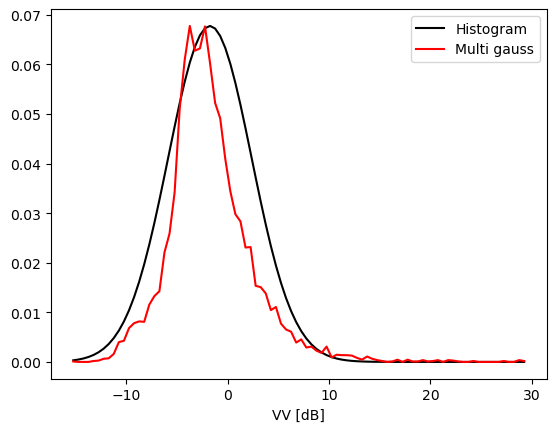

PyObject <matplotlib.legend.Legend object at 0x7fb5232916a0>

In [519]:
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(sure_cyan_VV ,round(Int64,length(sure_cyan_VV)/100))

#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()
PyPlot.plot(y,gauss_model(y,[maximum(w),mu_flood[1],sqrt(sigma_flood[1,1])]),color="k")

PyPlot.plot(y,w,color="r")
PyPlot.xlabel("VV [dB]")
PyPlot.legend(["Histogram","Multi gauss"])

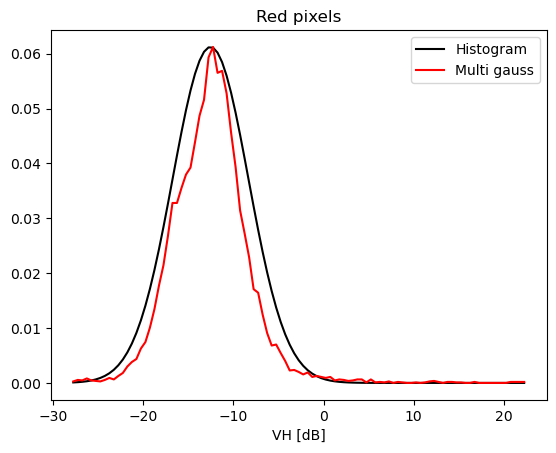

PyObject <matplotlib.legend.Legend object at 0x7fb523a78670>

In [520]:
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(sure_cyan_VH ,round(Int64,length(sure_cyan_VH)/100))

PyPlot.figure()
PyPlot.plot(y,gauss_model(y,[maximum(w),mu_flood[2],sqrt(sigma_flood[2,2])]),color="k")

PyPlot.plot(y,w,color="r")
PyPlot.xlabel("VH [dB]")
PyPlot.title("Red pixels")
PyPlot.legend(["Histogram","Multi gauss"])

In [299]:
semi_red = skimage_morph.binary_dilation(sure_red,ones(3,3)) .& .!sure_red ;
N_semi = sum(semi_red)

28305

In [300]:
suf_temp = Random.randperm(Random.MersenneTwister(124), sum(semi_red))

semi_red_VV = VV_db[1][semi_red][suf_temp]
semi_red_VH = VH_db[1][semi_red][suf_temp]
semi_red_dVV = delta_VV[semi_red][suf_temp]
semi_red_dVH = delta_VH[semi_red][suf_temp];

In [301]:
suf_temp = Random.randperm(Random.MersenneTwister(124), length(VV_db[1]))[1:10^5]

rand_VV = VV_db[1][suf_temp]
rand_VH = VH_db[1][suf_temp]
rand_dVV = delta_VV[suf_temp]
rand_dVH = delta_VH[suf_temp];

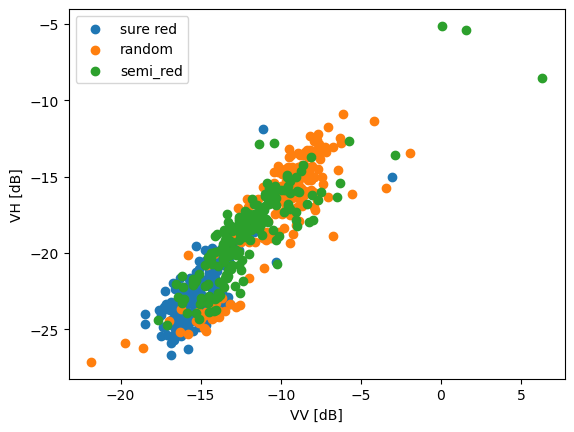

PyObject <matplotlib.legend.Legend object at 0x7fb5239aa610>

In [302]:
PyPlot.figure()
PyPlot.scatter(sure_red_VV[1:200] ,sure_red_VH[1:200])
PyPlot.scatter(rand_VV[1:200] ,rand_VH[1:200])
PyPlot.scatter(semi_red_VV[1:200] ,semi_red_VH[1:200])

PyPlot.xlabel("VV [dB]")
PyPlot.ylabel("VH [dB]")
PyPlot.legend(["sure red","random","semi_red"])

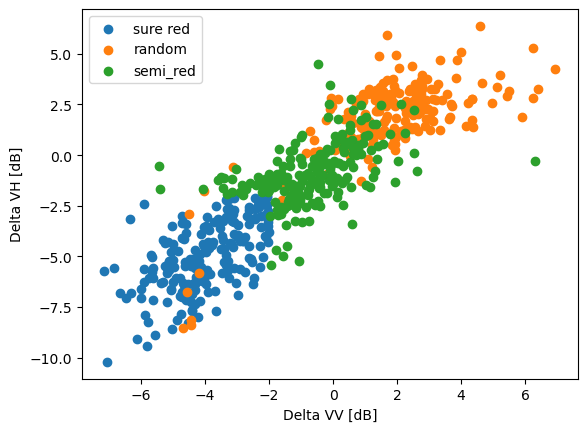

PyObject <matplotlib.legend.Legend object at 0x7fb52387ae20>

In [303]:
PyPlot.figure()
PyPlot.scatter(sure_red_dVV[1:200] ,sure_red_dVH[1:200])
PyPlot.scatter(rand_dVV[1:200] ,rand_dVH[1:200])
PyPlot.scatter(semi_red_dVV[1:200] ,semi_red_dVH[1:200])

PyPlot.xlabel("Delta VV [dB]")
PyPlot.ylabel("Delta VH [dB]")
PyPlot.legend(["sure red","random","semi_red"])

In [304]:
length(sure_red_VV), length(semi_red_VV)

(29877, 28305)

In [305]:
f_semi = 0
f_rand = 0

N_red = length(sure_red_VV)
N_semi =round(Int,N_red *f_semi)
N_rand =round(Int,N_red *f_rand)


train_VV = cat(sure_red_VV,semi_red_VV[1:N_semi],rand_VV[1:N_rand],dims=1)
train_VH = cat(sure_red_VH,semi_red_VH[1:N_semi],rand_VH[1:N_rand],dims=1);

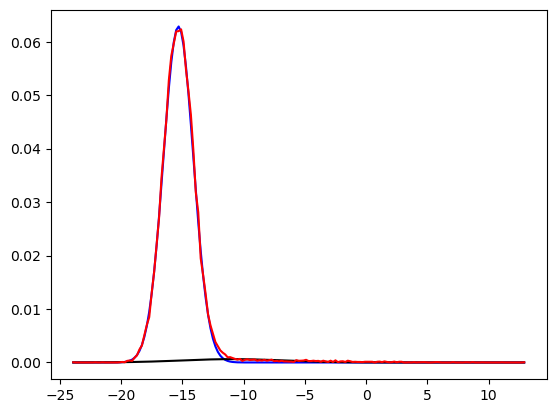

1-element Array{PyCall.PyObject,1}:
 PyObject <matplotlib.lines.Line2D object at 0x7fb519e8f460>

In [103]:
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(train_VV ,round(Int64,length(train_VV)/100))

#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")

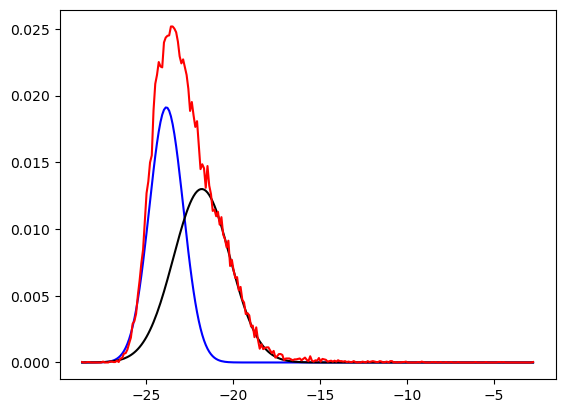

1-element Array{PyCall.PyObject,1}:
 PyObject <matplotlib.lines.Line2D object at 0x7fb519de6f10>

In [104]:
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(train_VH ,round(Int64,length(train_VH)/100))

#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,w,color="r")

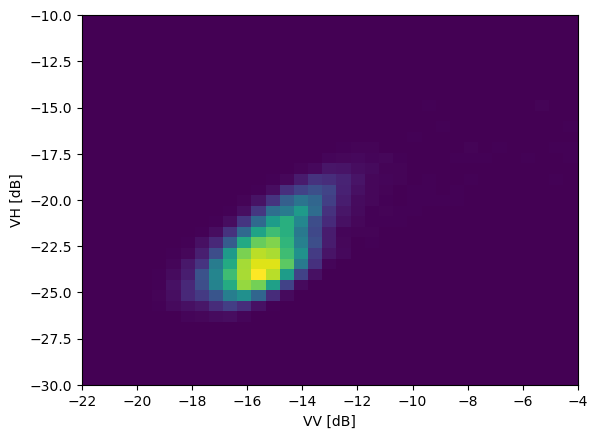

PyObject Text(24.0, 0.5, 'VH [dB]')

In [105]:
fig, axes = PyPlot.subplots()
axes.hist2d(train_VV ,train_VH,bins=35,range=[[-22,-4],[-30,-10]]);

PyPlot.xlabel("VV [dB]")
PyPlot.ylabel("VH [dB]")

In [106]:


train_dVV = cat(sure_red_dVV,semi_red_dVV[1:N_semi],rand_dVV[1:N_rand],dims=1)
train_dVH = cat(sure_red_dVH,semi_red_dVH[1:N_semi],rand_dVH[1:N_rand],dims=1);

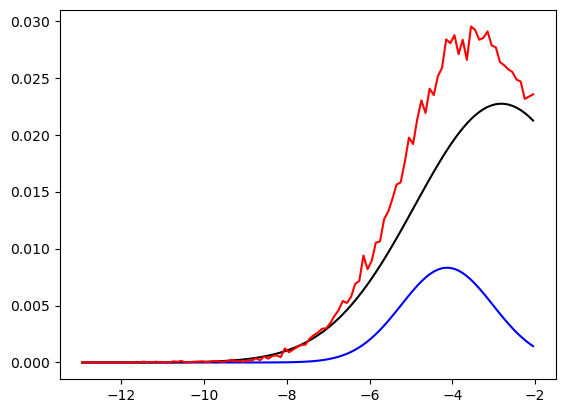

1-element Array{PyCall.PyObject,1}:
 PyObject <matplotlib.lines.Line2D object at 0x7fb519c7cee0>

In [110]:
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(train_dVV ,round(Int64,length(train_dVV)/200))

#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")

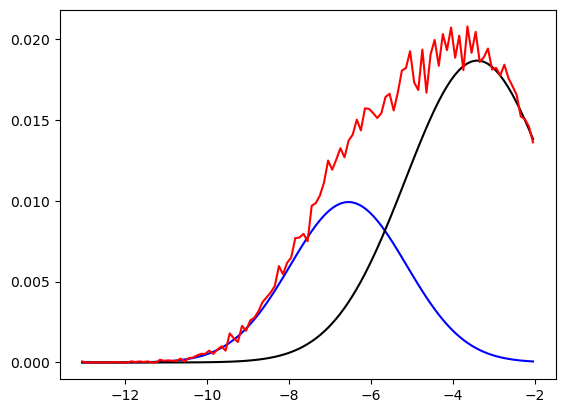

1-element Array{PyCall.PyObject,1}:
 PyObject <matplotlib.lines.Line2D object at 0x7fb519bdaf70>

In [111]:
p_fit,y,w,edges, w_sum = fit_bimodal_gauss(train_dVH ,round(Int64,length(train_dVH)/200))

#file_path = joinpath(figure_folder,"VV_histogram_tiles.png")
PyPlot.figure()

PyPlot.plot(y,gauss_model(y,p_fit[[1,3,5]]),color="b")
PyPlot.plot(y,gauss_model(y,p_fit[[2,4,6]]),color="k")
PyPlot.plot(y,w,color="r")

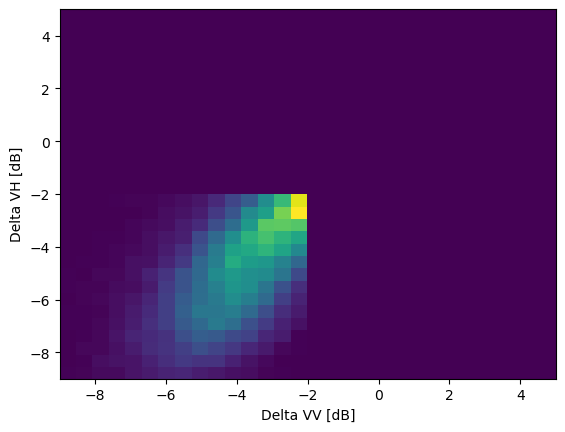

PyObject Text(24.000000000000007, 0.5, 'Delta VH [dB]')

In [109]:
fig, axes = PyPlot.subplots()
axes.hist2d(train_dVV ,train_dVH,bins=30,range=[[-9,5],[-9,5]]);

PyPlot.xlabel("Delta VV [dB]")
PyPlot.ylabel("Delta VH [dB]")

In [ ]:
add_mask